In [14]:
import numpy as np
import matplotlib.pyplot as plt 
import scipy
from scipy import linalg

from nilearn import datasets, image, plotting
from nilearn.input_data import NiftiMasker

from nilearn.image import smooth_img
import numpy as np

In [2]:
oasis_dataset = datasets.fetch_oasis_vbm(n_subjects= 416)

C:\Users\kimbe\Anaconda3\lib\site-packages\nilearn\datasets\struct.py:316: UserWarning: Only 403 subjects are available in the DARTEL-normalized version of the dataset. All of them will be used instead of the wanted 416
  % n_subjects)
C:\Users\kimbe\Anaconda3\lib\site-packages\numpy\lib\npyio.py:2278: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  output = genfromtxt(fname, **kwargs)


In [3]:
# diagnostic measures 
cdr = oasis_dataset.ext_vars['cdr'].astype(float)
mmse = oasis_dataset.ext_vars['mmse'].astype(float)
cdr_numpy_arr = np.array(cdr)
mmse_numpy_arr = np.array(mmse)

data = list(zip(cdr_numpy_arr, mmse_numpy_arr))

import pandas as pd
df = pd.DataFrame(data, columns = ['cdr', 'mmse'])
df = df.fillna(1)
df.head(n = 10)

C:\Users\kimbe\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


,cdr,mmse
0,0.0,29.0
1,0.0,29.0
2,0.5,27.0
3,1.0,-1.0
4,1.0,-1.0
5,1.0,-1.0
6,1.0,-1.0
7,1.0,-1.0
8,0.0,30.0
9,0.0,30.0


In [4]:
# create binary label (impaired = 1 and not impaired = 0 )from diagnoistic measures 
target = []
for row, column in df.iterrows():
    #print( column)
    if(column['cdr'] > 0.5 and column['mmse'] < 10): 
        target.append(1)
    else:
        target.append(0)

In [5]:
df['label'] = target
df.head()

,cdr,mmse,label
0,0.0,29.0,0
1,0.0,29.0,0
2,0.5,27.0,0
3,1.0,-1.0,1
4,1.0,-1.0,1


In [12]:
from nilearn.image import math_img 
gm_imgs = oasis_dataset.gray_matter_maps

# filter out normal, not impaired, images 
i = 0 
gray_normal = []
for gray in gm_imgs: 
    if target[i] == False: 
        gray_normal.append(gray)
    i = i + 1
    
# filter out impaired images 
i = 0
gray_impaired = []
for img in gm_imgs:
    if target[i] == True:
        gray_impaired.append(img)
    i = i + 1

In [9]:
gray_impaired_mean = math_img("np.mean(img, axis=-1)", img=gray_impaired)

In [10]:
gray_normal_mean = math_img("np.mean(img, axis=-1)", img=gray_normal) 

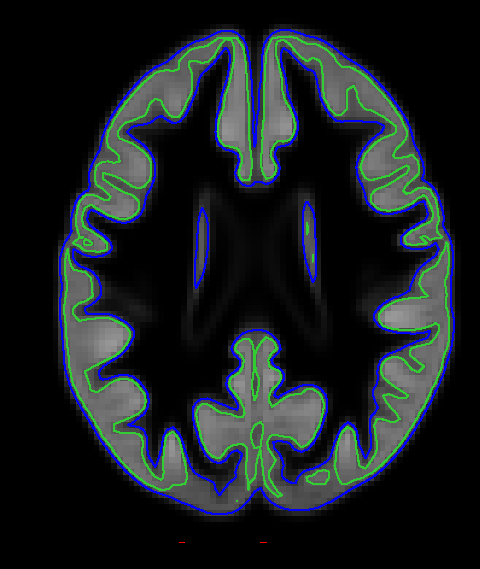

In [16]:
''' Gray matter impaired mean image show more pronounced atrophy in the centralized brain regions 
compared to the images defined as normal by the MMSE score. These neurodegeneration in the medial areas
are linked memory decline in AD and dementia patients ''' 
## impaired gray matter means 
fig = plt.figure(figsize=(6, 8), facecolor='k')
img_crop = image.crop_img(gray_impaired_mean, rtol=1e-01, copy=True)
display = plotting.plot_anat(img_crop, display_mode = 'z', cut_coords=[23], annotate = False, figure = fig)
display.add_contours(img_crop, contours=1, antialiased=False,linewidths= 1., levels=[0], colors=['red'])
display.add_contours(img_crop, contours=1, antialiased=False, linewidths=1., levels=[.3], colors=['blue'])
display.add_contours(img_crop, contours=1, antialiased=False, linewidths=1., levels=[.5], colors=['limegreen'])
plt.show()

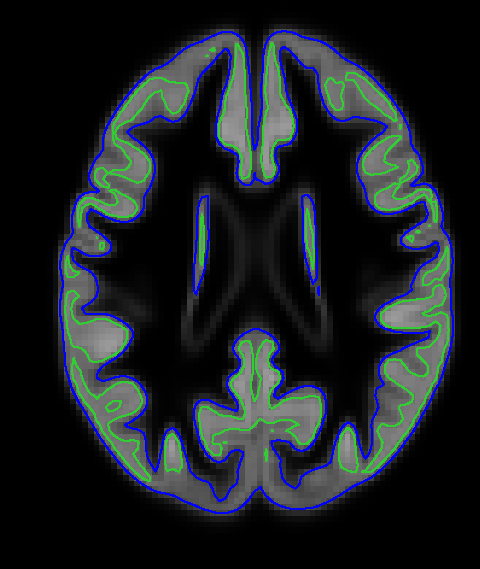

In [18]:
## normal gray matter means 
''' The normal, or not impaired, individuals show more dense centralized neural tissue in structual MRI scan. This finding is consistent 
with the centralized neurodegeneration linked to memory decline in AD and dementia. More specifically, the  centralized neural structures responsible for
processing and retrieving information are the hippocampus and parahippocampal gyrus experience synaptic decline.'''
fig = plt.figure(figsize=(6, 8), facecolor='k')
img_crop6 = image.crop_img(gray_normal_mean, rtol=1e-01, copy=True)
display = plotting.plot_anat(img_crop6, display_mode = 'z', cut_coords=[23], annotate = False, figure = fig)
display.add_contours(img_crop6, contours=1, antialiased=False,linewidths= 1., levels=[0], colors=['red'])
display.add_contours(img_crop6, contours=1, antialiased=False, linewidths=1., levels=[.3], colors=['blue'])
display.add_contours(img_crop6, contours=1, antialiased=False, linewidths=1., levels=[.5], colors=['limegreen'])
plt.show()

In [19]:
mean_difference_gray = image.math_img("img1 - img2", img1 =gray_normal_mean, img2 = gray_impaired_mean)

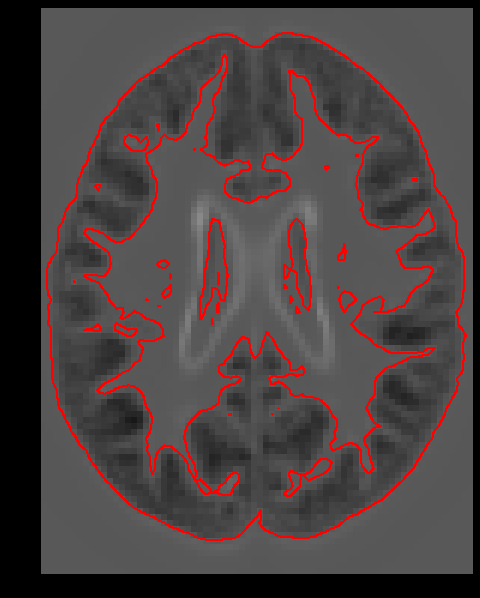

In [21]:
# mean difference of impaired gray matter images from normal gray matter images 

fig = plt.figure(figsize=(6, 8), facecolor='k')
md_crop = image.crop_img(mean_difference_gray, rtol=1e-01, copy=True)
display = plotting.plot_anat(md_crop, display_mode = 'z', cut_coords=[23], annotate = False, figure = fig)
display.add_contours(md_crop, contours=1, antialiased=False,linewidths= 1., levels=[0], colors=['red'])
display.add_contours(md_crop, contours=1, antialiased=False, linewidths=1., levels=[.3], colors=['blue'])
display.add_contours(md_crop, contours=1, antialiased=False, linewidths=1., levels=[.5], colors=['limegreen'])
plt.show()

In [34]:
df['gray_matter_maps'] = gm_imgs

In [46]:
df.tail(n = 50)

,cdr,mmse,label,gray_matter_maps
353,0.5,30.0,0,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0402_M...
354,1.0,-1.0,1,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0403_M...
355,0.0,29.0,0,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0404_M...
356,1.0,23.0,0,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0405_M...
357,1.0,-1.0,1,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0406_M...
358,1.0,-1.0,1,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0407_M...
359,1.0,-1.0,1,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0408_M...
360,1.0,-1.0,1,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0409_M...
361,1.0,-1.0,1,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0410_M...
362,0.5,29.0,0,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0411_M...


In [45]:
df_labels = list(zip(trainx, trainy))
labels_ck = pd.DataFrame(df_labels, columns = ['trainx', 'trainy'])
labels_ck.head()
#labels_ck.to_csv('train_img_target.csv')

,trainx,trainy
0,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0259_M...,0
1,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0296_M...,1
2,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0179_M...,0
3,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0123_M...,0
4,C:\Users\kimbe/nilearn_data\oasis1\OAS1_0019_M...,0


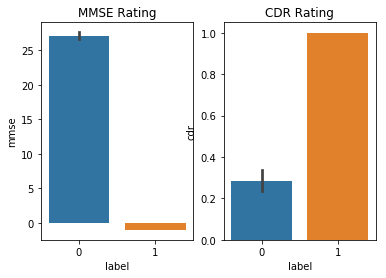

In [15]:
import seaborn as sns 
plt.subplot(1, 2, 1)
sns.barplot(x = 'label', y = 'mmse', data = df)
plt.title("MMSE Rating")
plt.subplot(1, 2, 2)
sns.barplot(x= 'label', y= 'cdr', data = df)
plt.title("CDR Rating")

plt.show()

In [6]:
# portion data by binary label 
from sklearn.utils import check_random_state
from sklearn.model_selection import train_test_split
rng = check_random_state(42)
gm_imgs = oasis_dataset.gray_matter_maps
label = target

trainx, testx, trainy, testy = train_test_split(
    gm_imgs, label, train_size=.7, random_state=rng)

C:\Users\kimbe\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [31]:
len(trainy)

282

In [32]:
len(testy)


121

In [23]:
# process data 
import os
try:
    os.makedirs("C:\\Users\\kimbe\\NN\\Train\\not_impaired")
except OSError:
    print("error")
try:
    os.makedirs("C:\\Users\\kimbe\\NN\\Train\\impaired")
except OSError:
    print("error")
try:
    os.makedirs("C:\\Users\\kimbe\\NN\\Test\\not_impaired")
except OSError:
    print("error")
try:
    os.makedirs("C:\\Users\\kimbe\\NN\\Test\\impaired")
except OSError:
    print("error")

error
error


C:\Users\kimbe\Anaconda3\lib\site-packages\matplotlib\figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "
C:\Users\kimbe\Anaconda3\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"
C:\Users\kimbe\Anaconda3\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)
C:\Users\kimbe\Anaconda3\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)
C:\Users\kimbe\Anaconda3\lib\site-packages\matplotlib\contour.

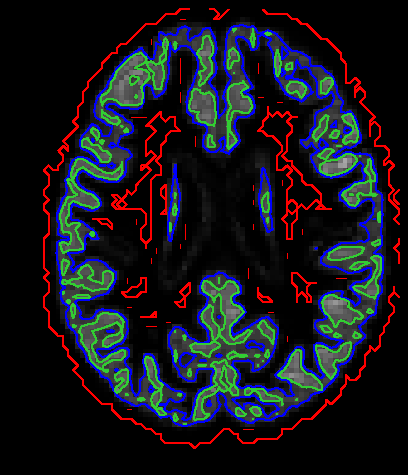

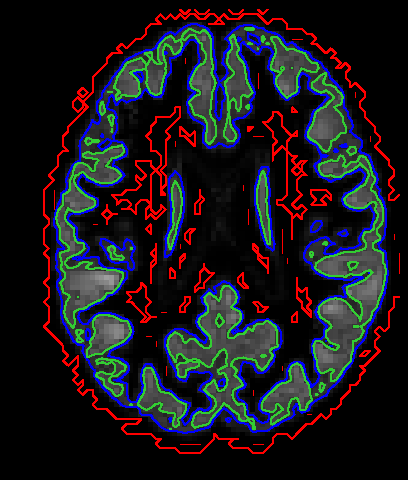

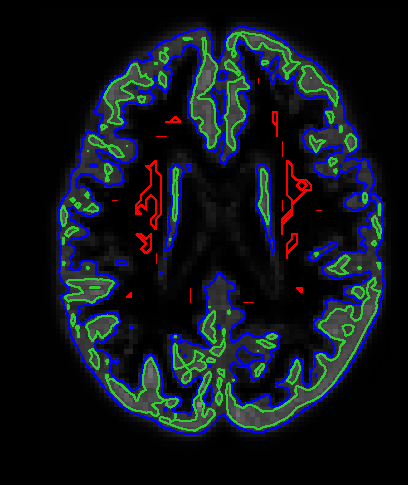

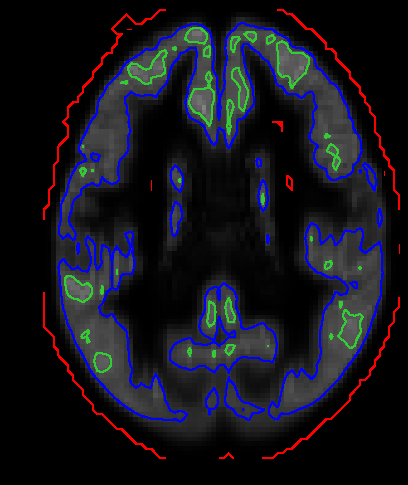

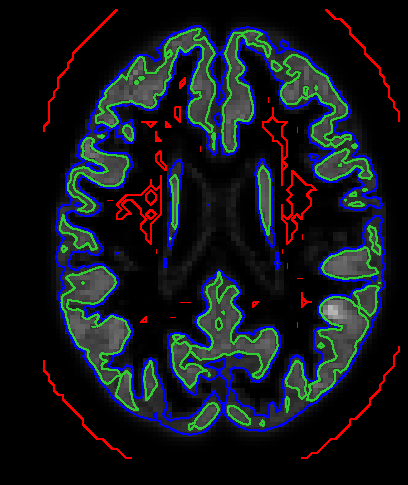

...

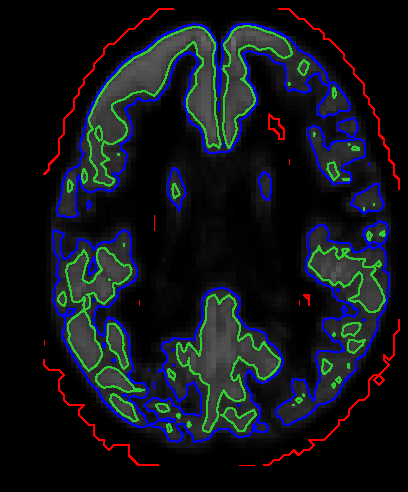

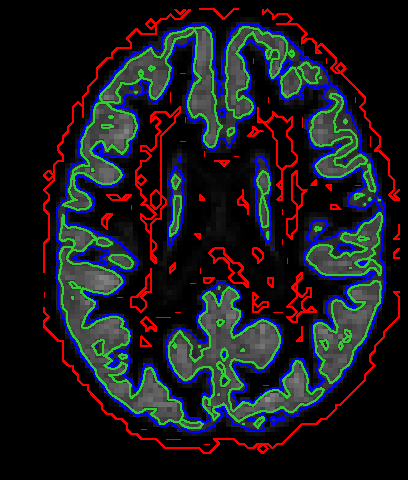

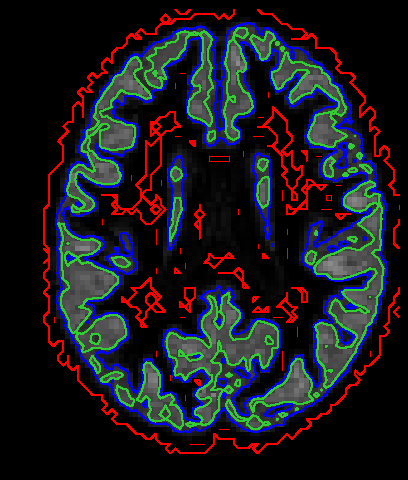

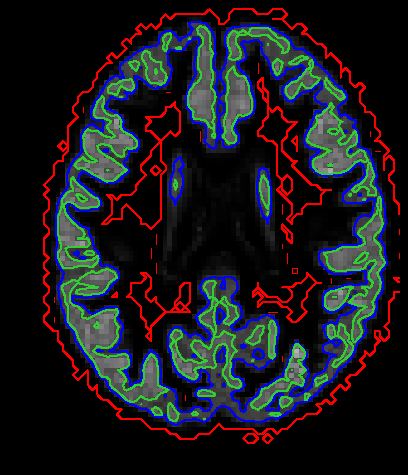

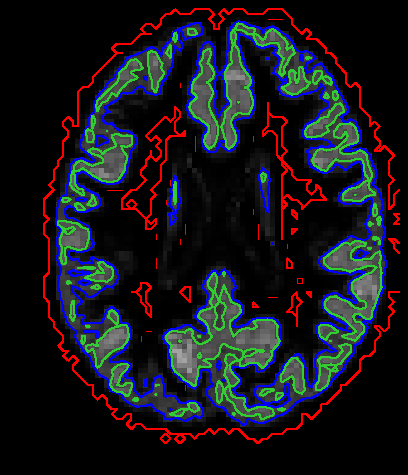

In [33]:
# training data 
from nilearn import image, plotting
i = 0
for img in trainx:
    fig = plt.figure(figsize=(5, 7), facecolor='k')
    img_crop = image.crop_img(img, rtol=1e-0001, copy=True)
    display = plotting.plot_anat(img_crop, display_mode = 'z', cut_coords=[23], annotate = False, figure = fig)
    display.add_contours(img_crop, contours=1, antialiased=False,linewidths= 1., levels=[0], colors=['red'])
    display.add_contours(img_crop, contours=1, antialiased=False, linewidths=1., levels=[.3], colors=['blue'])
    display.add_contours(img_crop, contours=1, antialiased=False, linewidths=1., levels=[.5], colors=['limegreen'])
    
    if trainy[i] == 0:
        fig.savefig('C:\\Users\\kimbe\\NN\Train\\not_impaired\\' + 'brain' + str(i) + '.png')
    elif trainy[i] == 1:
        fig.savefig('C:\\Users\\kimbe\\NN\\Train\\impaired\\' + 'brain' + str(i) + '.png')
    i = i + 1